## Load Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import Dense,Conv2DTranspose,Conv2D,MaxPooling2D,ReLU,Softmax,Dropout,Flatten,Reshape,LeakyReLU,BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import plot_model

## Load Dataset

In [2]:
(X,_),(_,_) = tf.keras.datasets.mnist.load_data()

In [3]:
X = X.astype(np.float32)/127.5 - 1

In [4]:
X.max(),X.min()

(1.0, -1.0)

In [5]:
X = np.expand_dims(X,axis=3)

In [6]:
X.shape

(60000, 28, 28, 1)

In [7]:
BATCH_SIZE = 128

In [8]:
dataset = tf.data.Dataset.from_tensor_slices(X)
dataset = dataset.shuffle(buffer_size=100).batch(BATCH_SIZE,drop_remainder=True).prefetch(1)

## Visualize 

In [9]:
def plot_img(images,n_col=None):
    if images.shape[-1] == 1:
        images = np.squeeze(images,axis=-1)
    n_col = n_col or len(images)
    n_row = (len(images)-1)//(n_col-1)
    fig = plt.figure(figsize=(n_col,n_row))
    
    for index,img in enumerate(images):
        plt.subplot(n_row,n_col,index+1)
        plt.imshow(img,cmap='binary')
        plt.axis('off')

## Generator

In [10]:
NOISE = 100

In [11]:
generator = Sequential()
generator.add(Dense(7*7*512,activation=LeakyReLU(alpha=0.2),input_shape=[NOISE]))
generator.add(Reshape([7,7,512]))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(256,kernel_size=4,strides=1,padding='same',activation=LeakyReLU(alpha=0.2)))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(256,kernel_size=4,strides=2,padding='same',activation=LeakyReLU(alpha=0.2)))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(128,kernel_size=4,strides=1,padding='same',activation=LeakyReLU(alpha=0.2)))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(128,kernel_size=4,strides=1,padding='same',activation=LeakyReLU(alpha=0.2)))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(64,kernel_size=3,strides=2,padding='same',activation=LeakyReLU(alpha=0.2)))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(64,kernel_size=3,strides=1,padding='same',activation=LeakyReLU(alpha=0.2)))
generator.add(BatchNormalization())
generator.add(Conv2DTranspose(1,kernel_size=4,strides=1,padding='same',activation='tanh'))

In [12]:
generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 25088)             2533888   
                                                                 
 reshape (Reshape)           (None, 7, 7, 512)         0         
                                                                 
 batch_normalization (BatchN  (None, 7, 7, 512)        2048      
 ormalization)                                                   
                                                                 
 conv2d_transpose (Conv2DTra  (None, 7, 7, 256)        2097408   
 nspose)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 7, 7, 256)        1024      
 hNormalization)                                                 
                                                        

In [13]:
plot_model(generator,show_layer_names=True,show_shapes=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.


## Test Generator

(15, 100)
the shape of image is (15, 28, 28, 1)


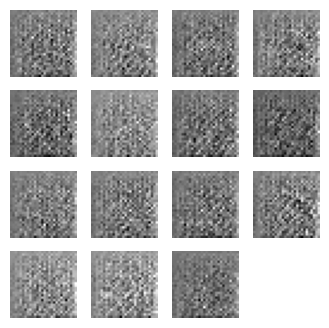

In [14]:
data_points = tf.random.normal([15,NOISE])

print(data_points.shape)
gen_images = generator(data_points)

plot_img(gen_images,n_col=4)

print(f'the shape of image is {gen_images.shape}')

## Discriminator

In [15]:
discriminator = Sequential()
discriminator.add(Conv2D(256,kernel_size=3,activation=LeakyReLU(alpha=0.2),padding='same',input_shape=[28,28,1]))
discriminator.add(Dropout(0.2))
discriminator.add(Conv2D(128,kernel_size=4,activation=LeakyReLU(alpha=0.2),padding='same',strides=2))
discriminator.add(Dropout(0.1))
discriminator.add(Conv2D(64,kernel_size=3,activation=LeakyReLU(alpha=0.2),padding='same',strides=2))
discriminator.add(Dropout(0.2))
discriminator.add(Conv2D(32,kernel_size=2,activation=LeakyReLU(alpha=0.2),padding='same',strides=2))
discriminator.add(Dropout(0.1))
discriminator.add(Conv2D(16,kernel_size=2,activation=LeakyReLU(alpha=0.2),padding='same'))
discriminator.add(Flatten())
discriminator.add(Dense(1,activation='sigmoid'))

In [16]:
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 256)       2560      
                                                                 
 dropout (Dropout)           (None, 28, 28, 256)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 128)       524416    
                                                                 
 dropout_1 (Dropout)         (None, 14, 14, 128)       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 7, 7, 64)          73792     
                                                                 
 dropout_2 (Dropout)         (None, 7, 7, 64)          0         
                                                                 
 conv2d_3 (Conv2D)           (None, 4, 4, 32)         

In [17]:
plot_model(discriminator,show_layer_names=True,show_shapes=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.


In [18]:
discriminator.compile(optimizer='adam',loss='binary_crossentropy',metrics=['acc'])

In [19]:
discriminator.trainable = False

## Create and train GAN

In [20]:
GAN = Sequential([generator,discriminator])
GAN.compile(optimizer='adam',loss='binary_crossentropy',metrics=['acc'])

In [21]:
GAN.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 28, 28, 1)         6584193   
                                                                 
 sequential_1 (Sequential)   (None, 1)                 611313    
                                                                 
Total params: 7,195,506
Trainable params: 6,581,377
Non-trainable params: 614,129
_________________________________________________________________


In [22]:
def train_gan(gan,dataset,random_data_points,n_epochs=50):
    gen,dis = gan.layers
    
    print(gen.summary())
    
    for i in range(1,n_epochs+1):
        print(f'Epoch {i}/{n_epochs}')
        
        for real_images in dataset:
            batch_size = real_images.shape[0]
            
            
            data_points = tf.random.normal(shape=[batch_size,random_data_points])
            
            
            gen_images = gen(data_points)
            
            all_imgs = tf.concat([gen_images,real_images],axis=0)
            
            labels = tf.constant([[0.]]*batch_size+[[1.]]*batch_size)
            
            ## Train discriminator
            
            dis.trainable = True
            
            dis.train_on_batch(all_imgs,labels)
            
            ## Train generator
            
            noise = tf.random.normal(shape=[batch_size,random_data_points])
            new_labels = tf.constant([[1.]]*batch_size)
            dis.trainable = False
            gan.train_on_batch(noise,new_labels)
            
        plot_img(gen_images,8)
        plt.show()
            

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 25088)             2533888   
                                                                 
 reshape (Reshape)           (None, 7, 7, 512)         0         
                                                                 
 batch_normalization (BatchN  (None, 7, 7, 512)        2048      
 ormalization)                                                   
                                                                 
 conv2d_transpose (Conv2DTra  (None, 7, 7, 256)        2097408   
 nspose)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 7, 7, 256)        1024      
 hNormalization)                                                 
                                                        

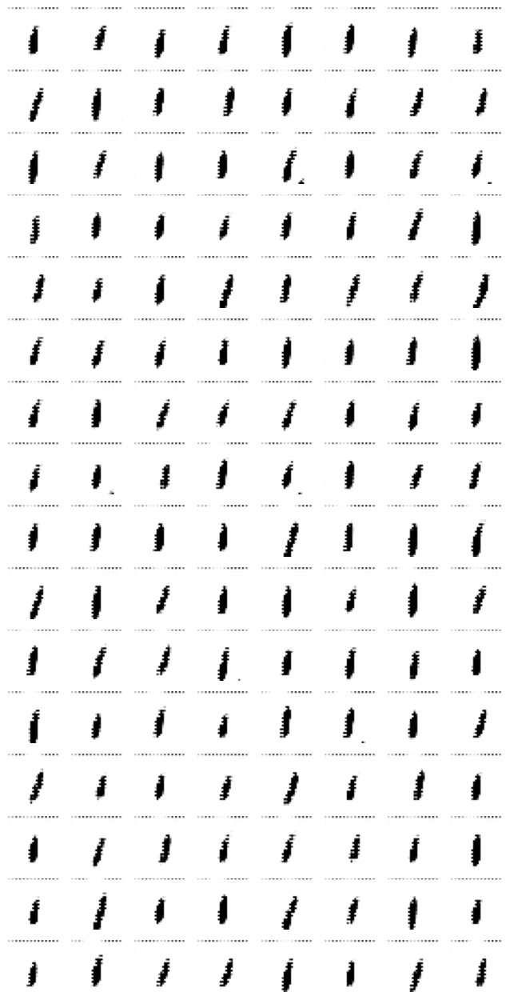

Epoch 2/50


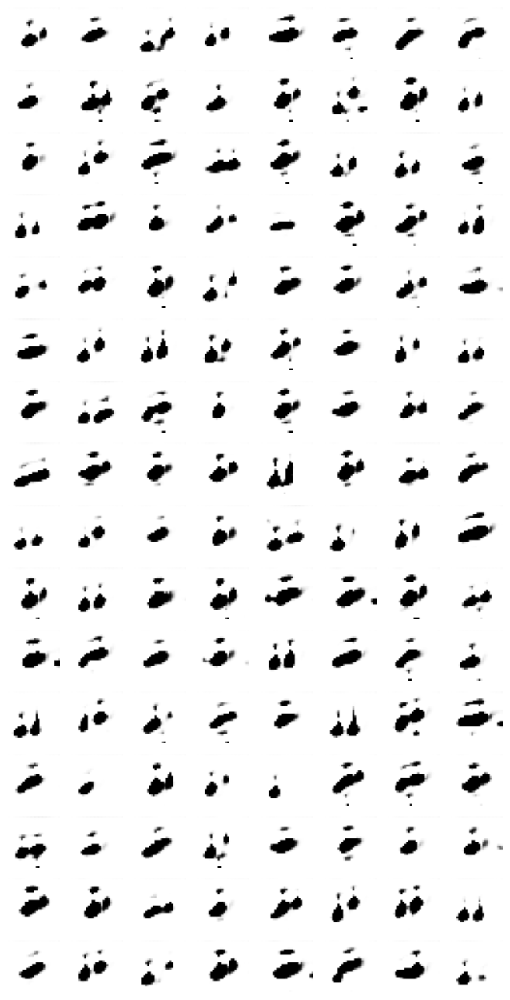

Epoch 3/50


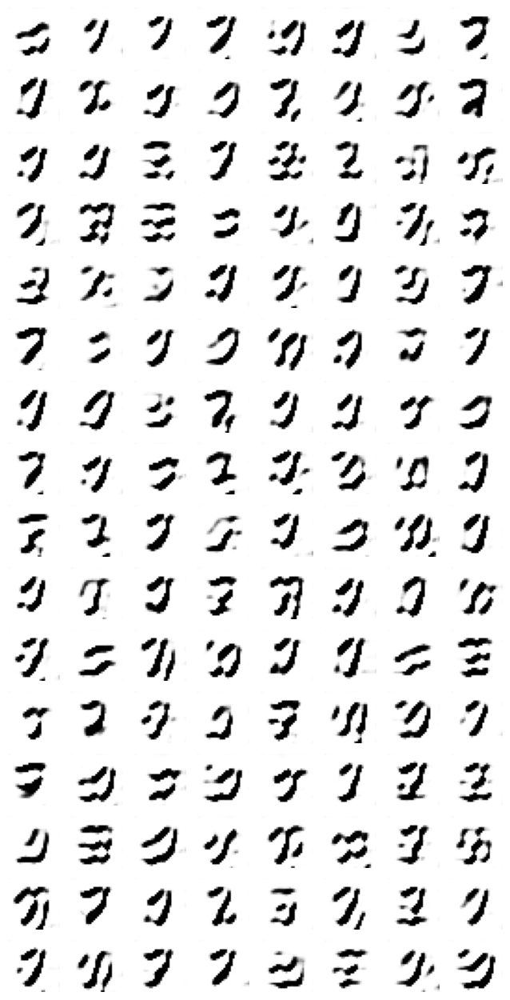

Epoch 4/50


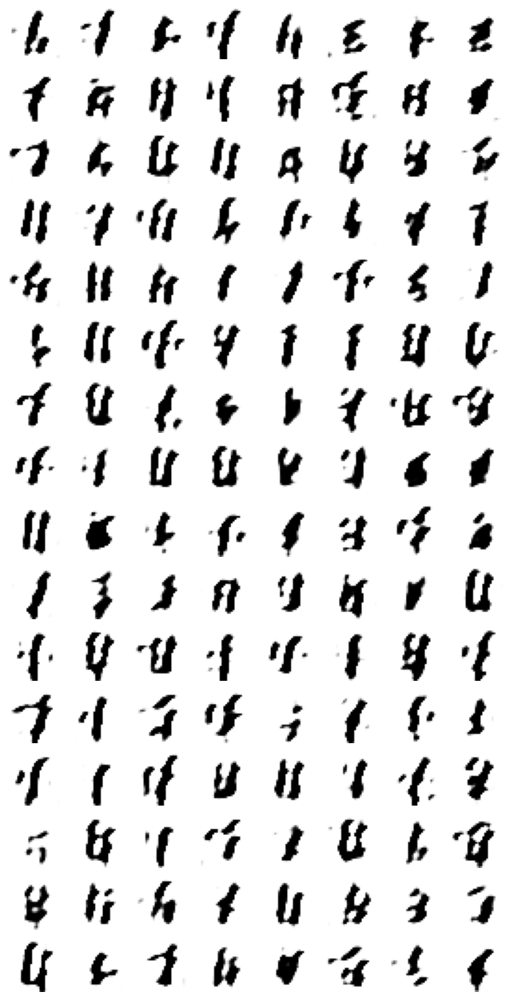

Epoch 5/50


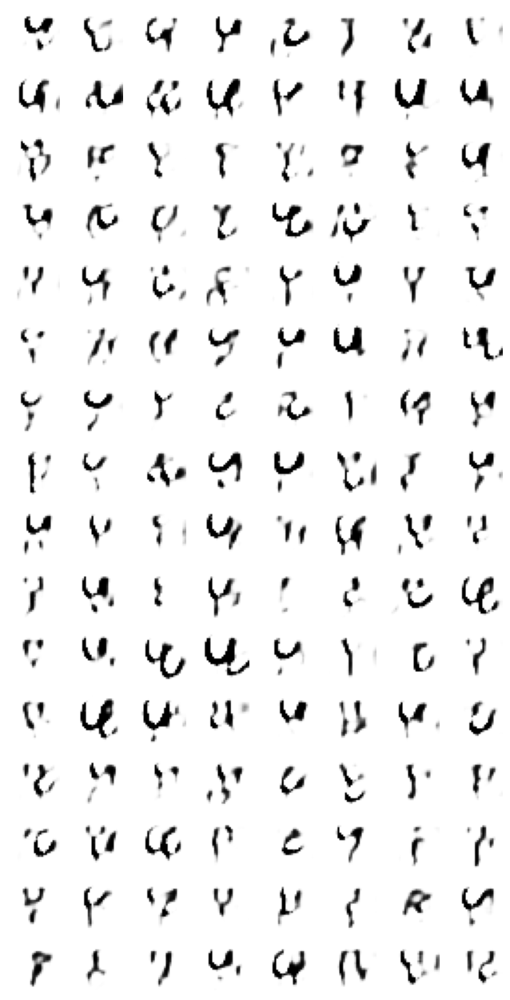

Epoch 6/50


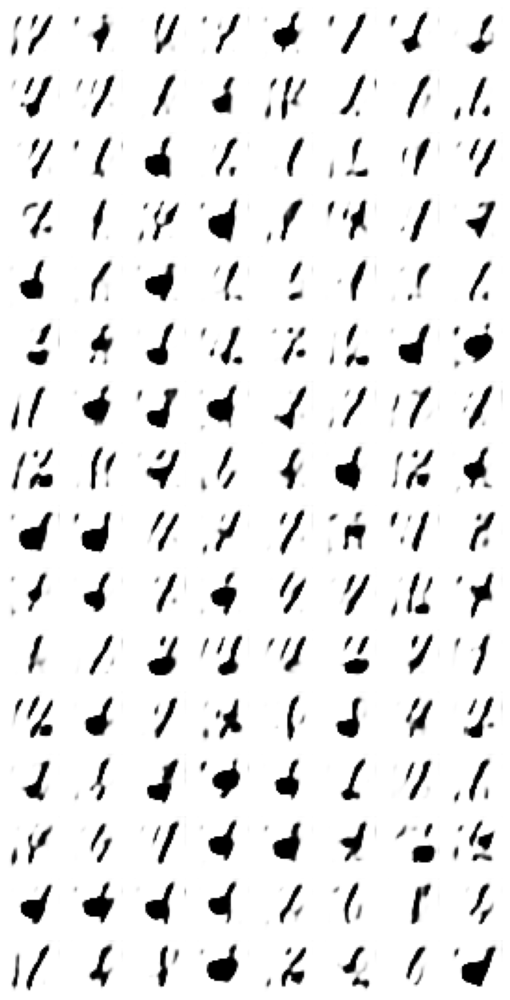

Epoch 7/50


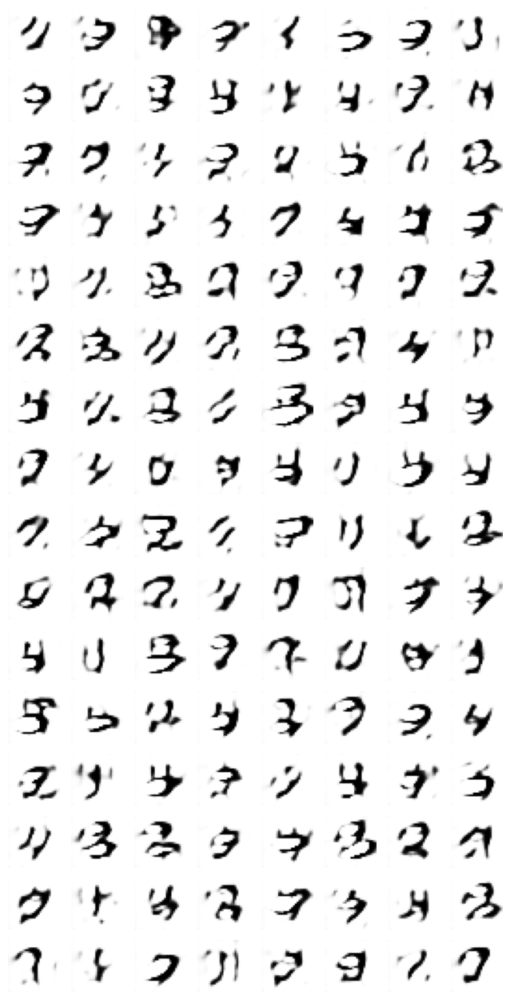

Epoch 8/50


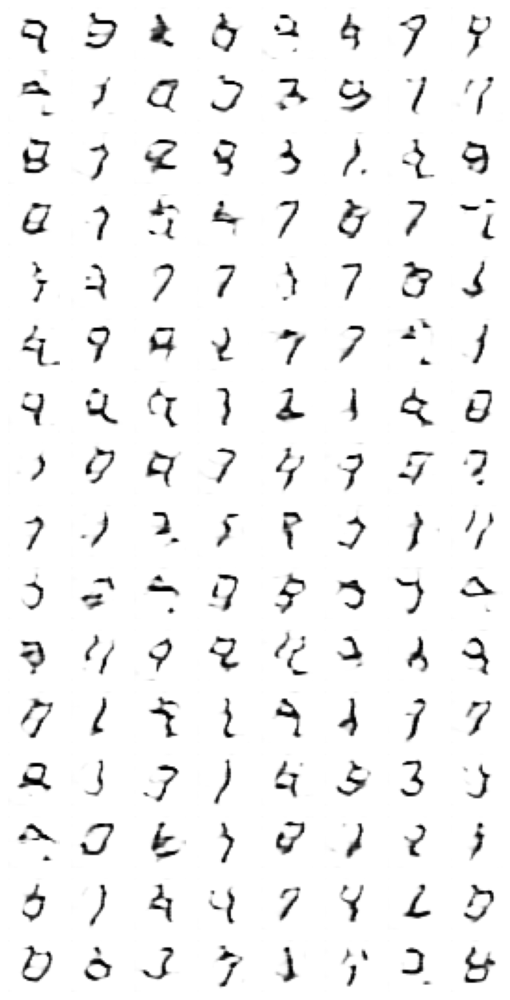

Epoch 9/50


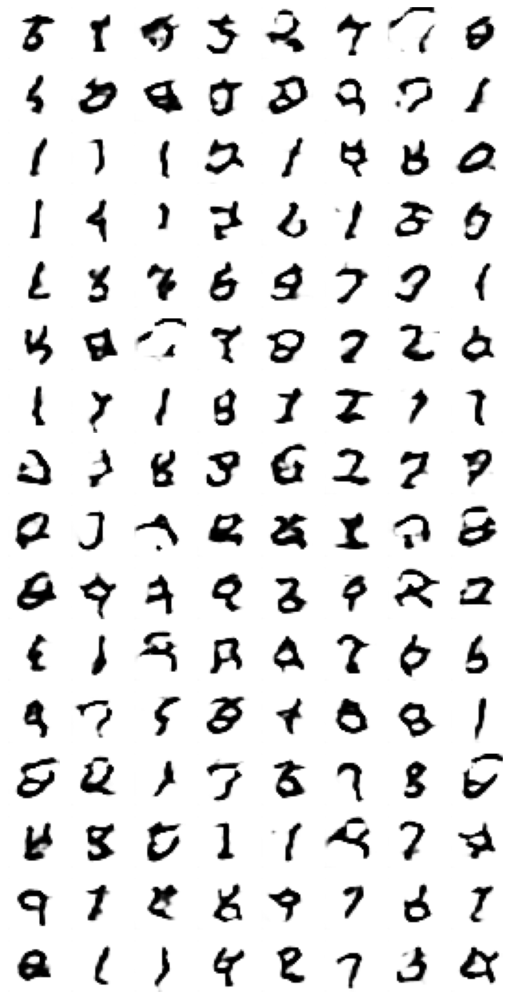

Epoch 10/50


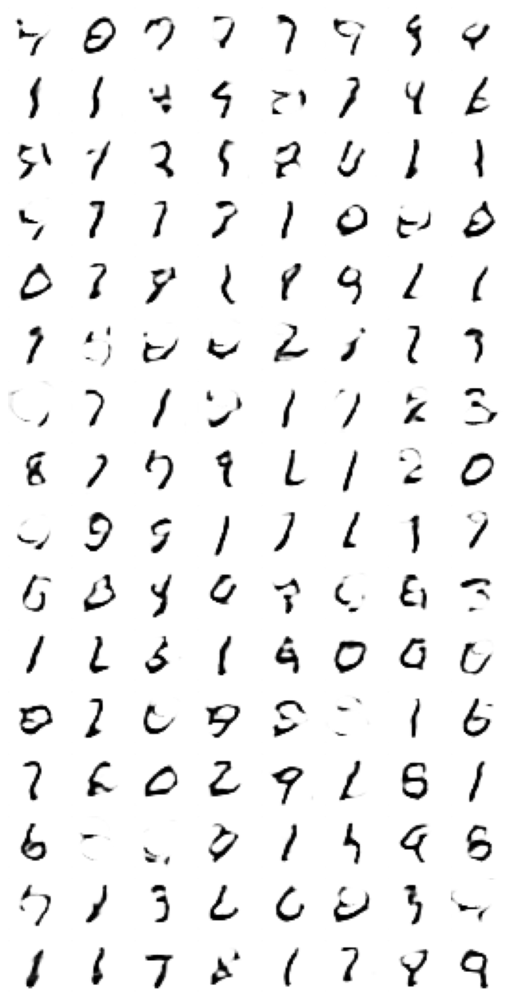

Epoch 11/50


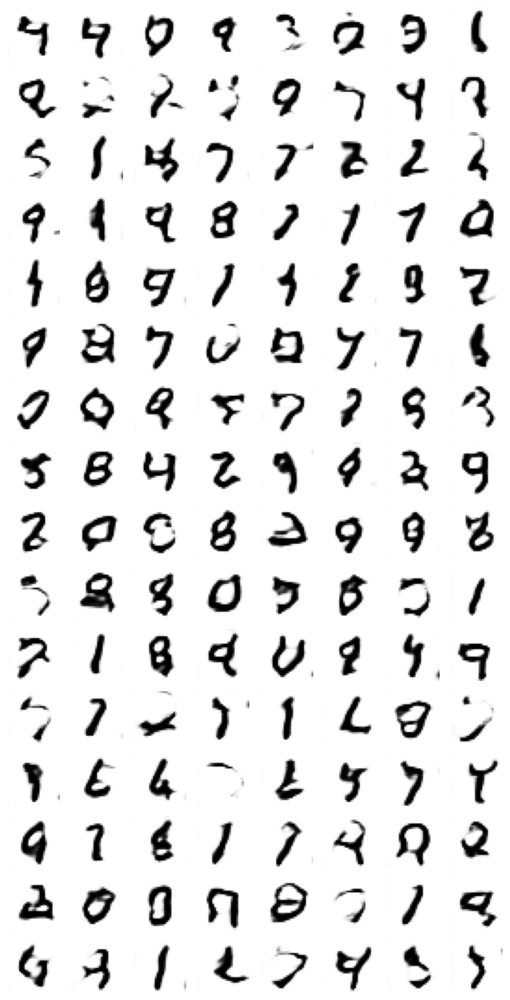

Epoch 12/50


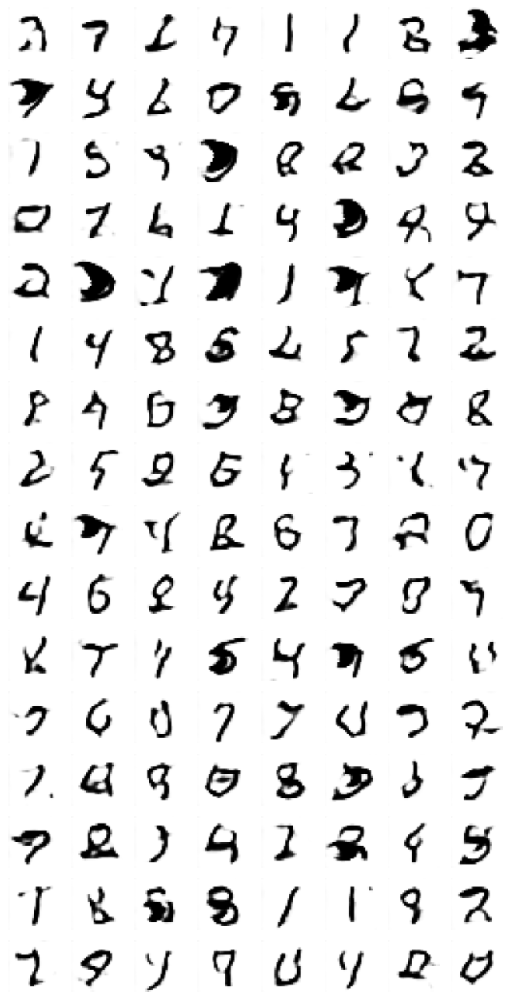

Epoch 13/50


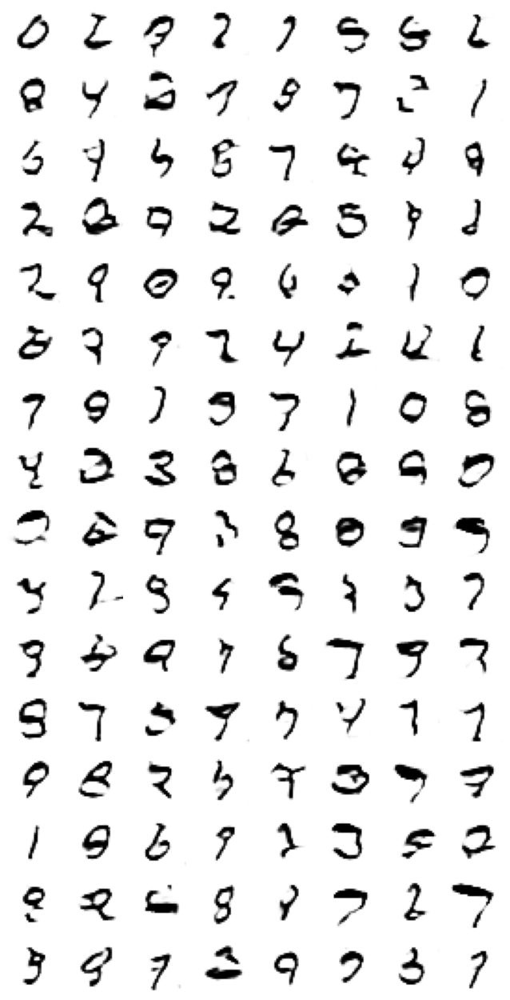

Epoch 14/50


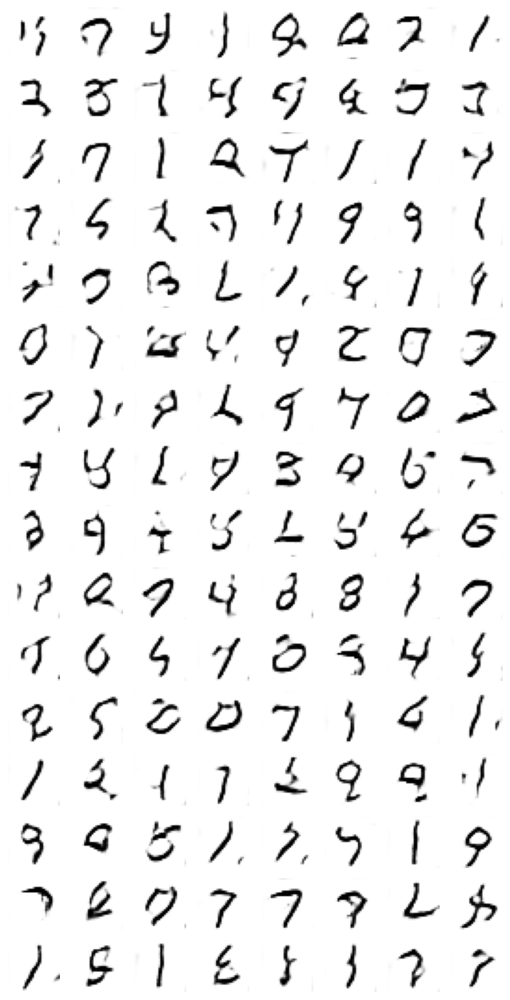

Epoch 15/50


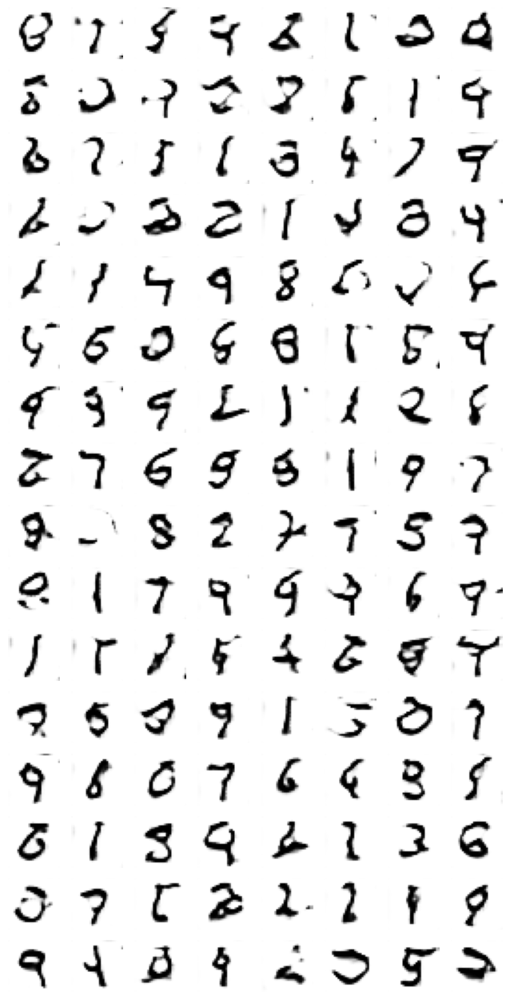

Epoch 16/50


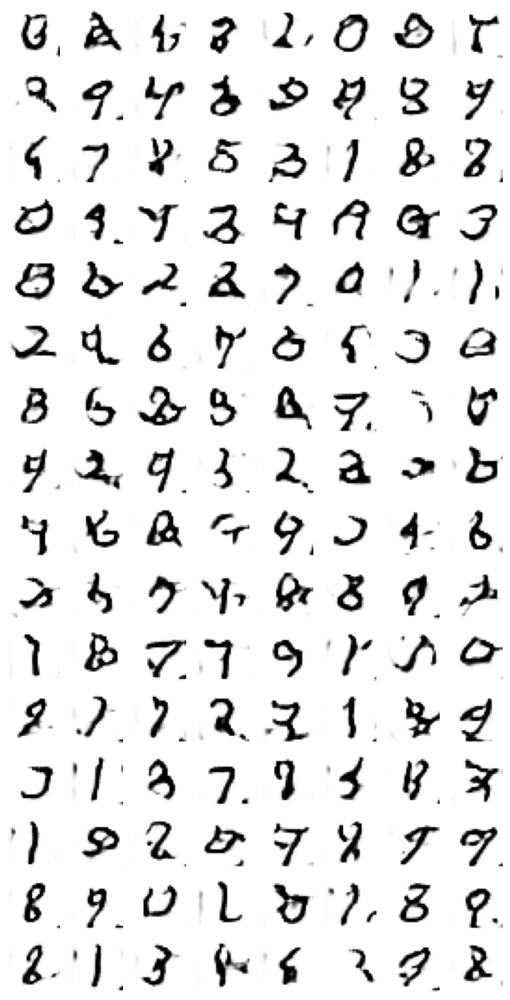

Epoch 17/50


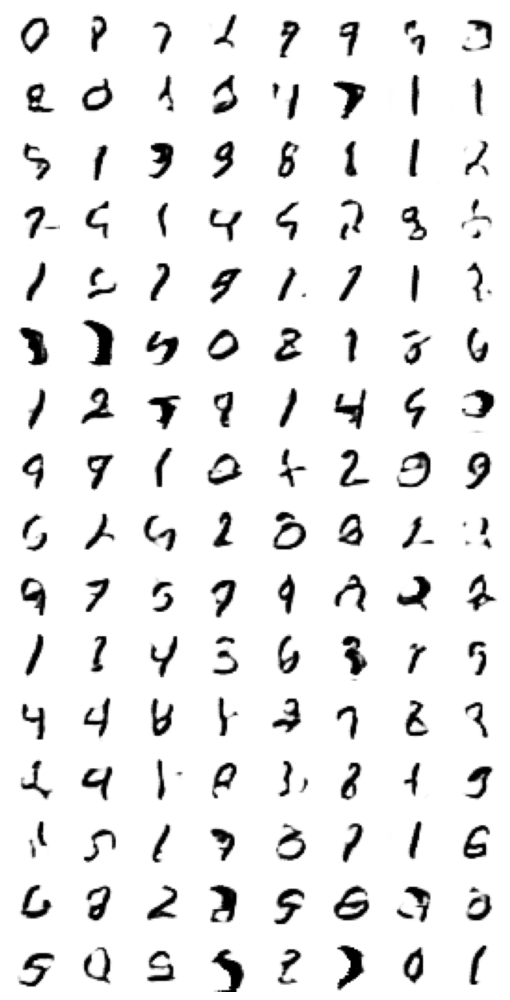

Epoch 18/50


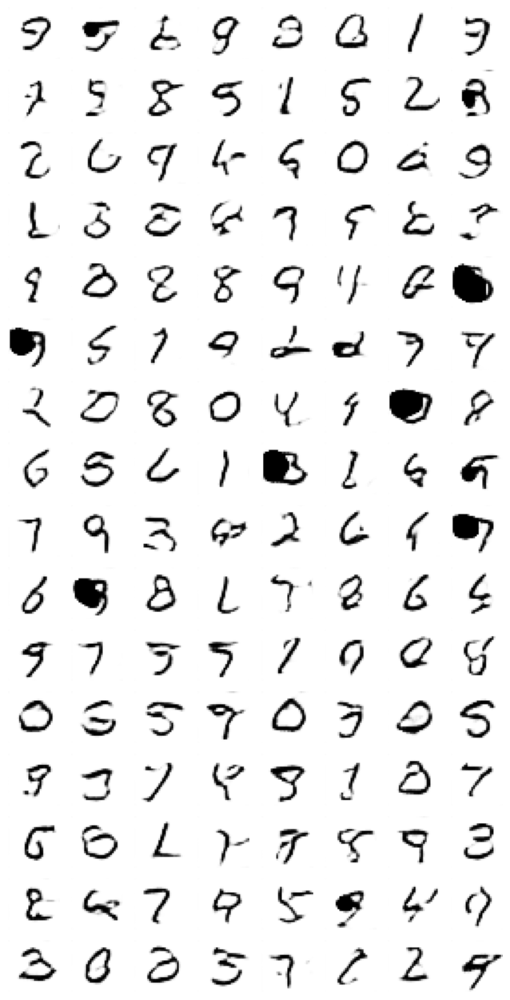

Epoch 19/50


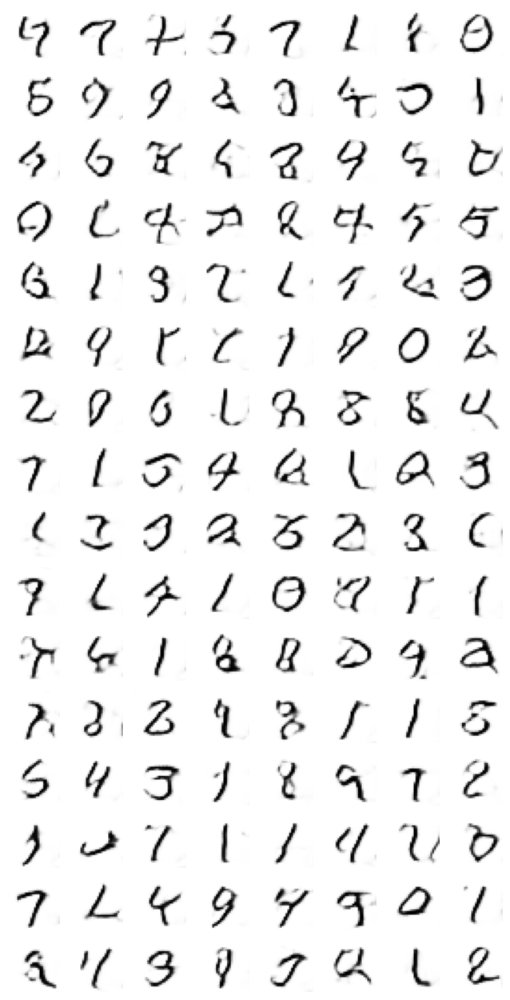

Epoch 20/50


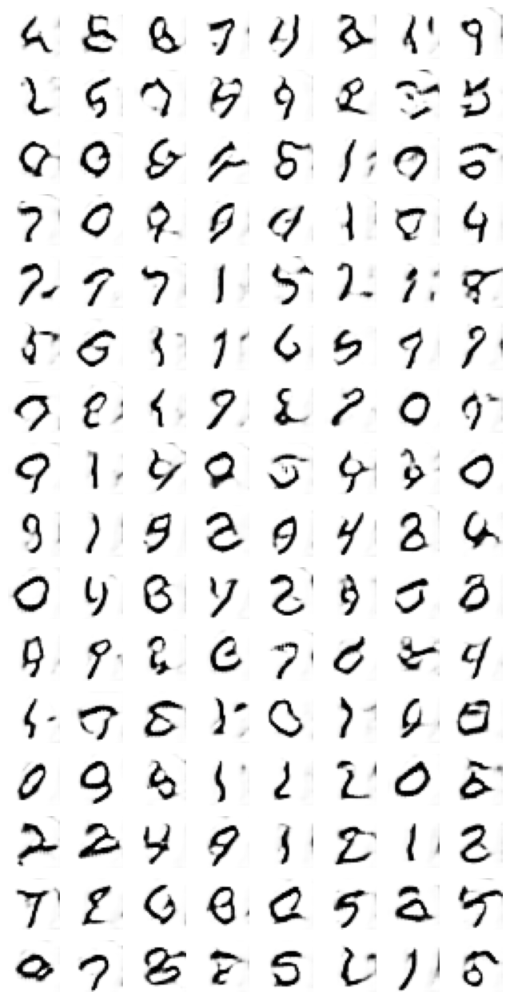

Epoch 21/50


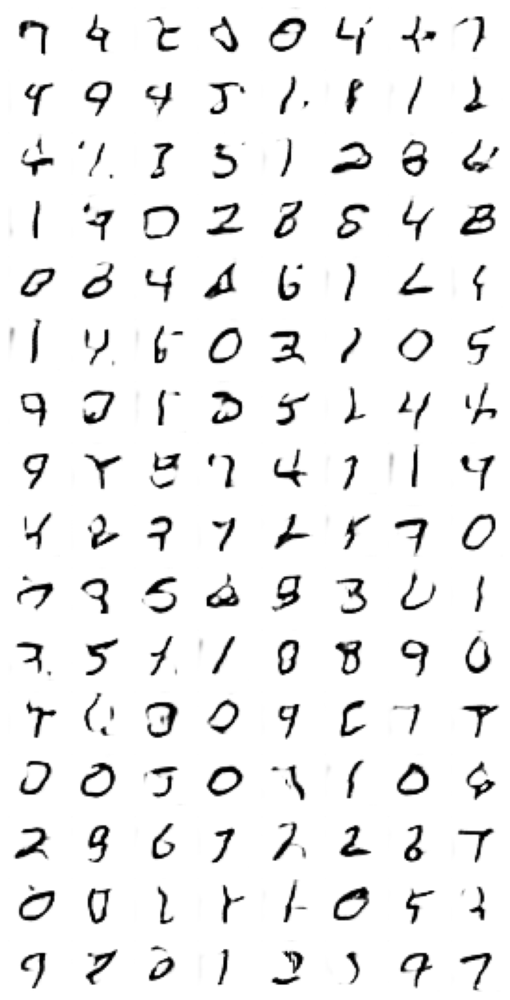

Epoch 22/50


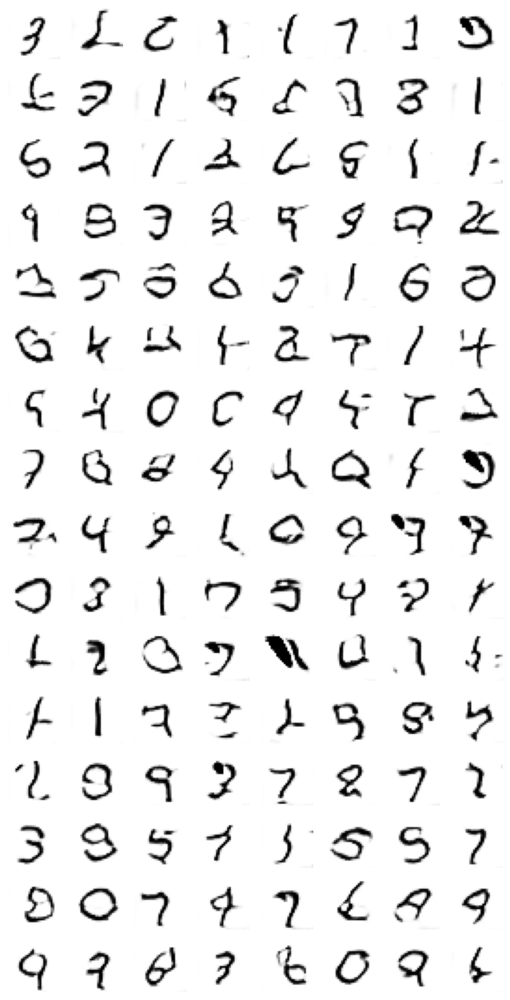

Epoch 23/50


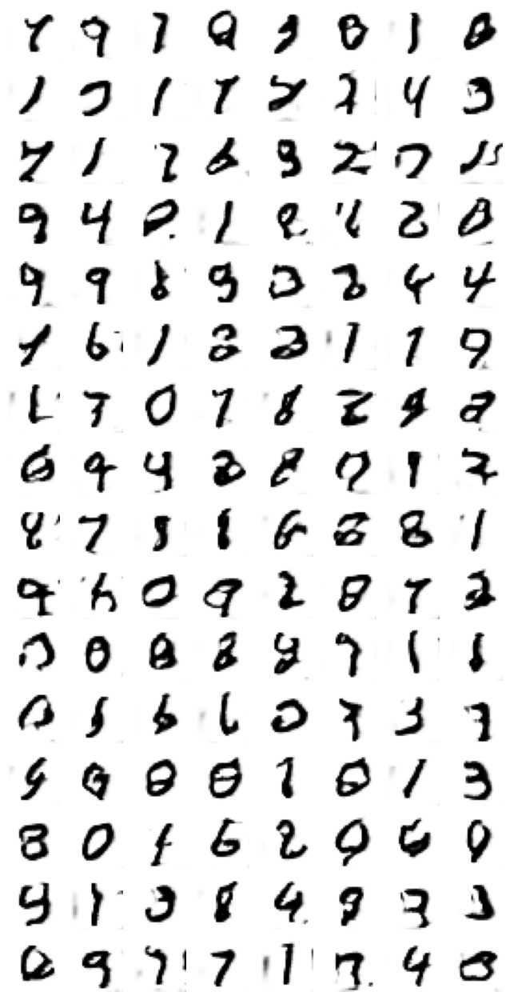

Epoch 24/50


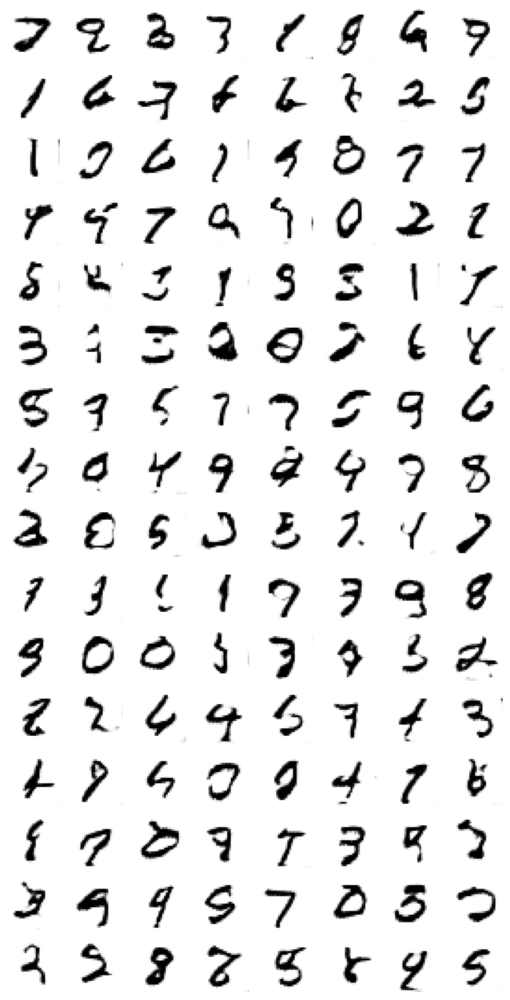

Epoch 25/50


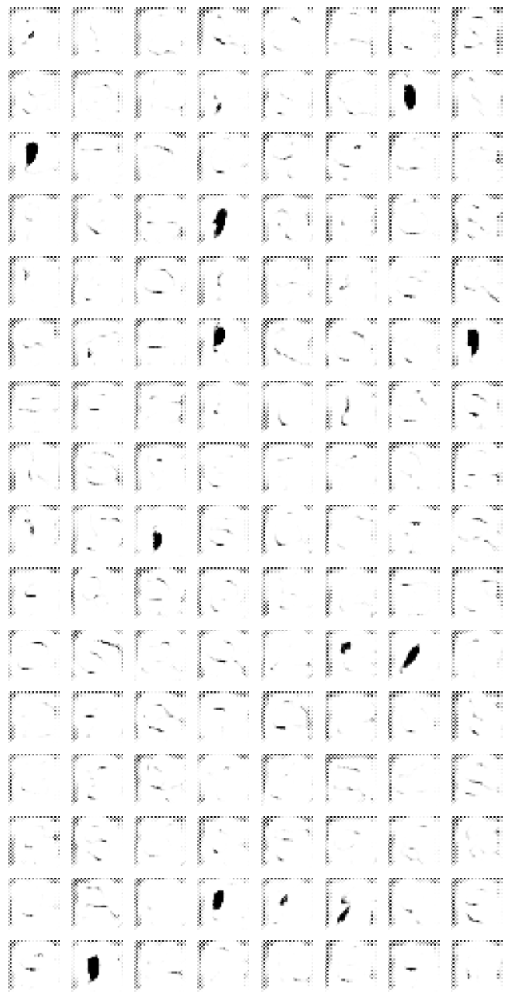

Epoch 26/50


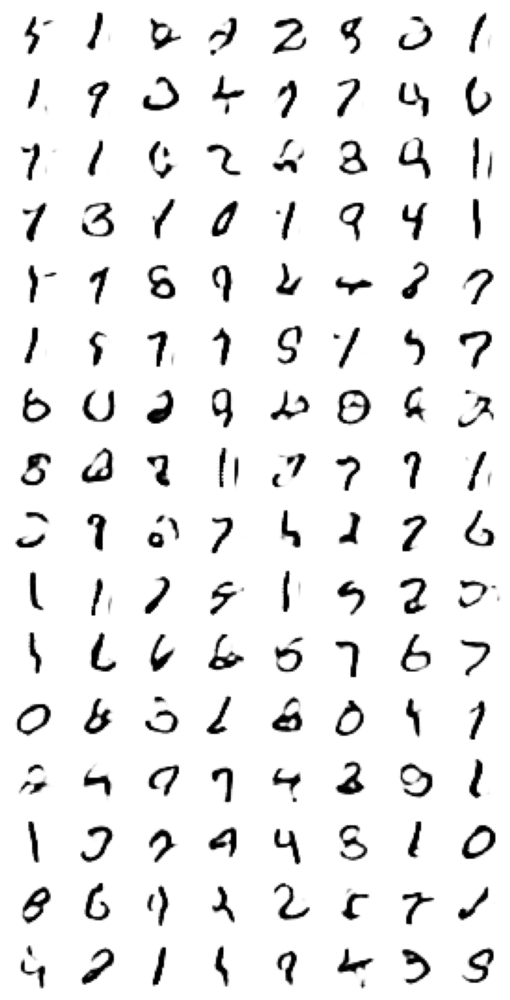

Epoch 27/50


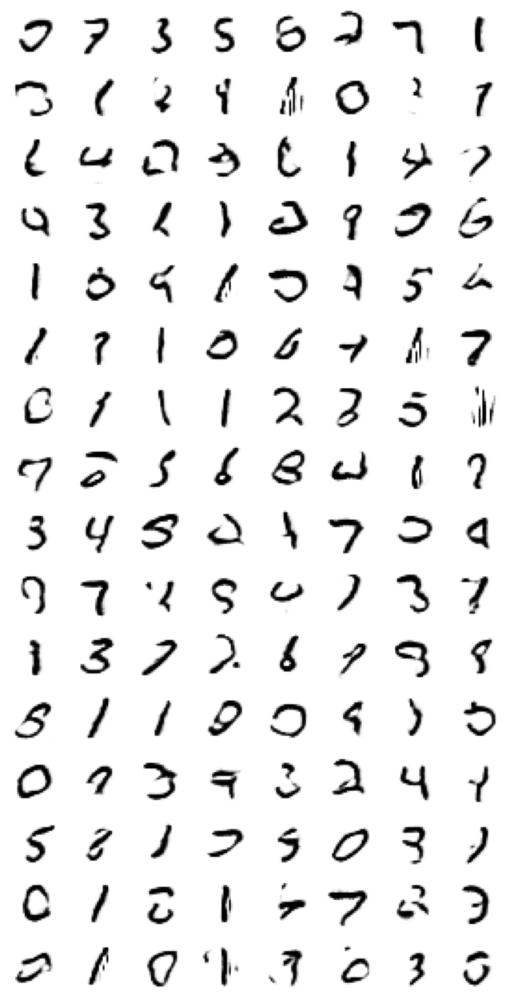

Epoch 28/50


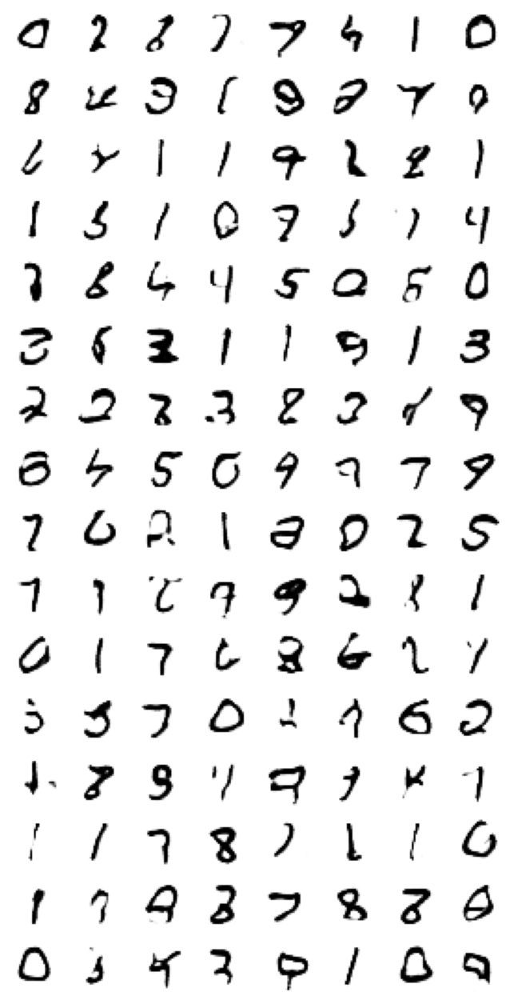

Epoch 29/50


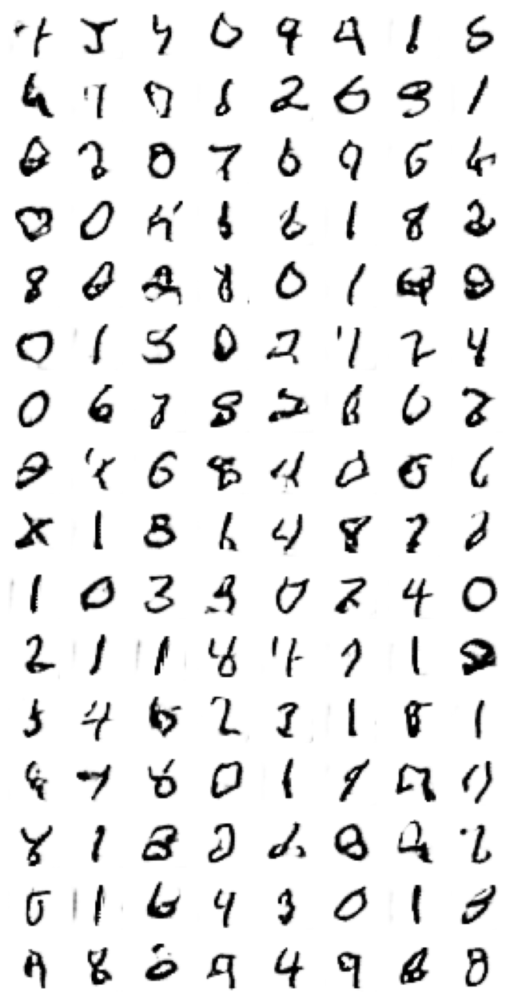

Epoch 30/50


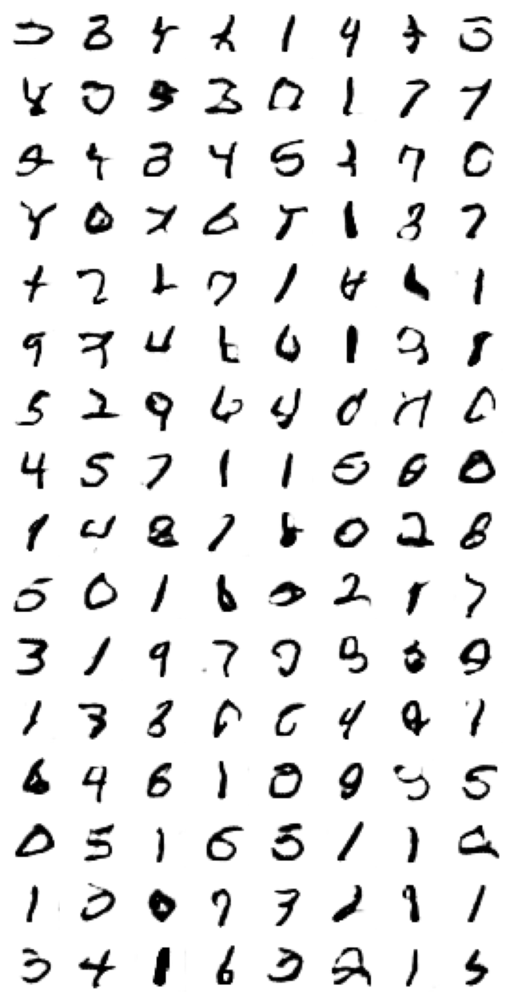

Epoch 31/50


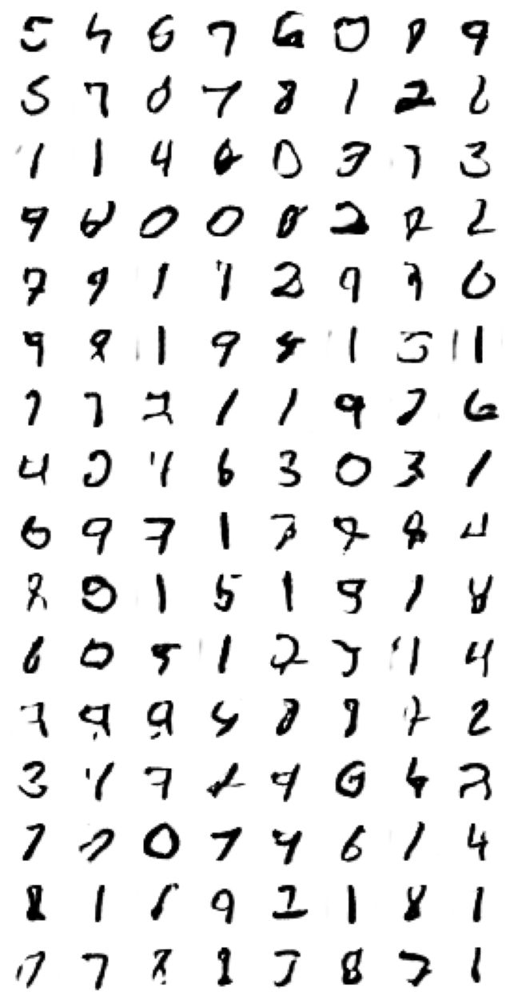

Epoch 32/50


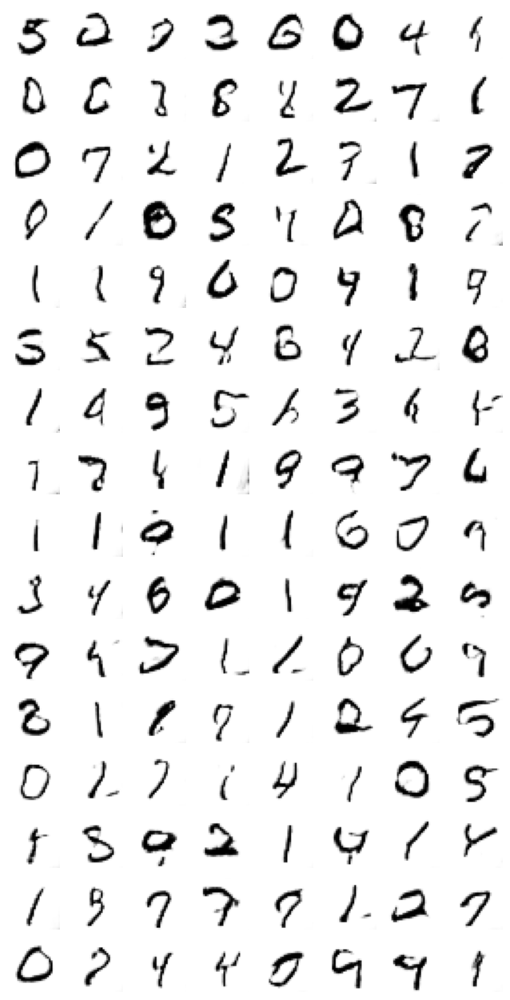

Epoch 33/50


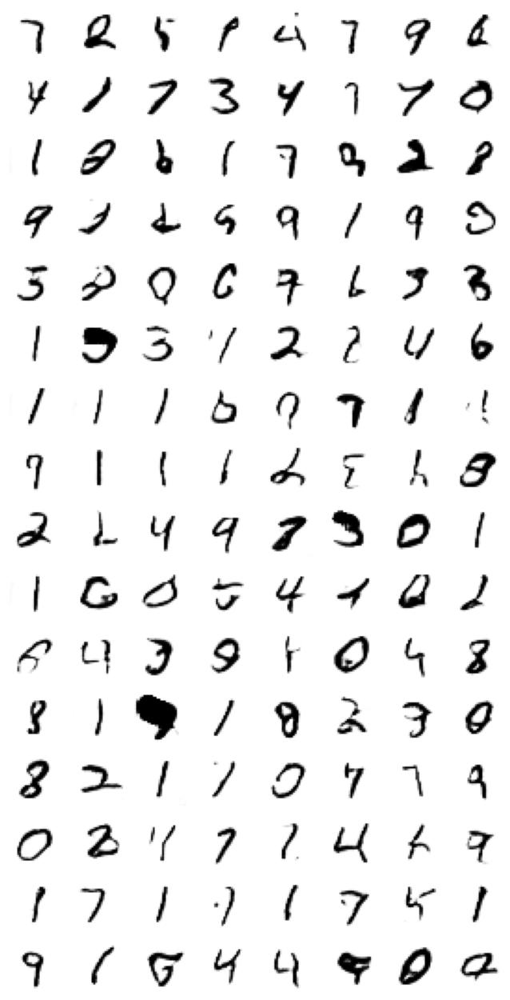

Epoch 34/50


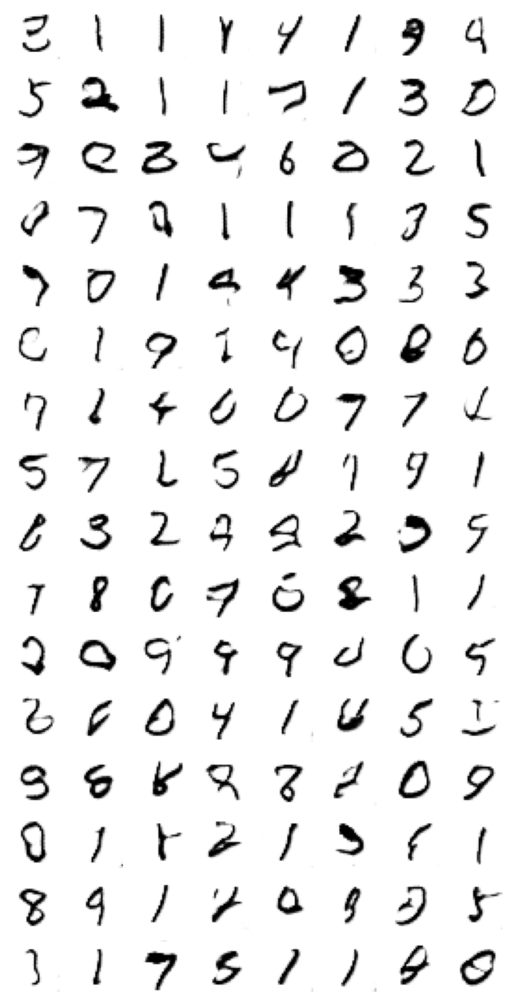

Epoch 35/50


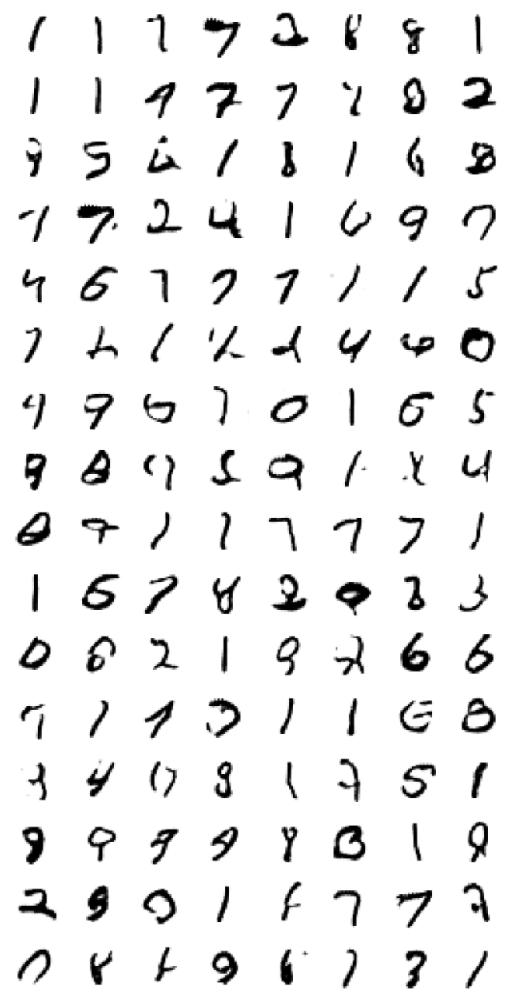

Epoch 36/50


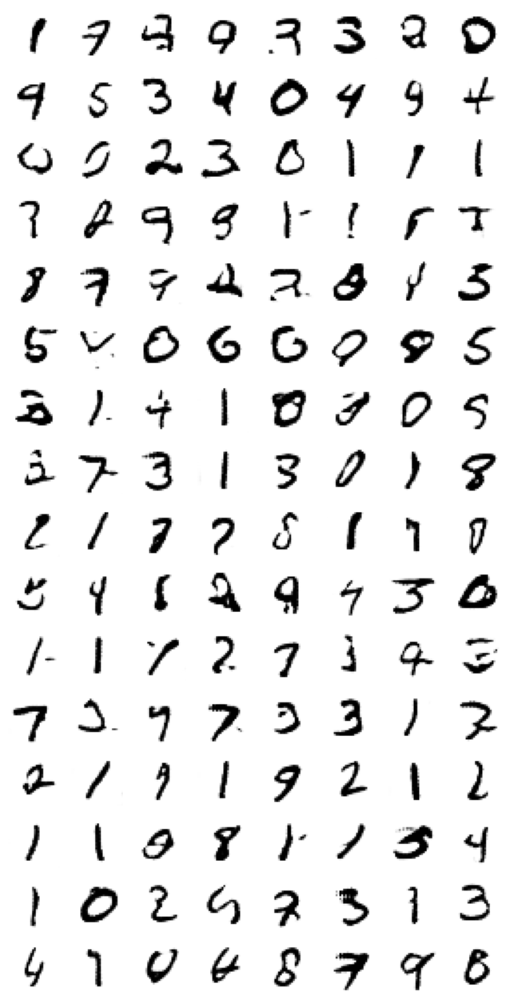

Epoch 37/50


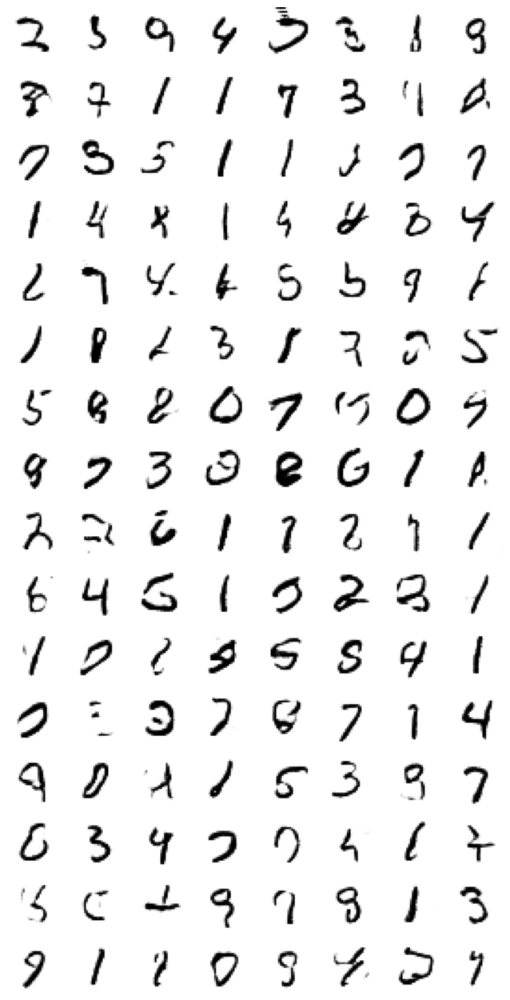

Epoch 38/50


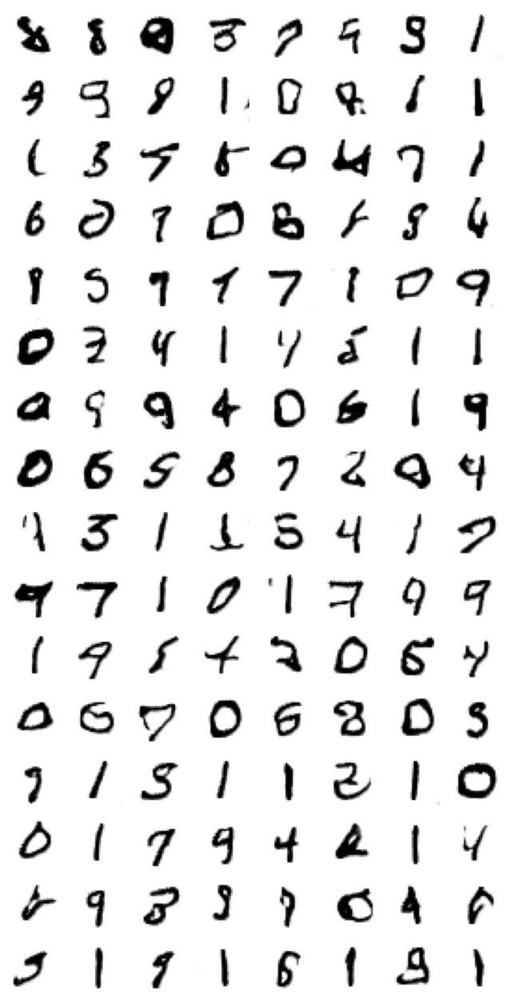

Epoch 39/50


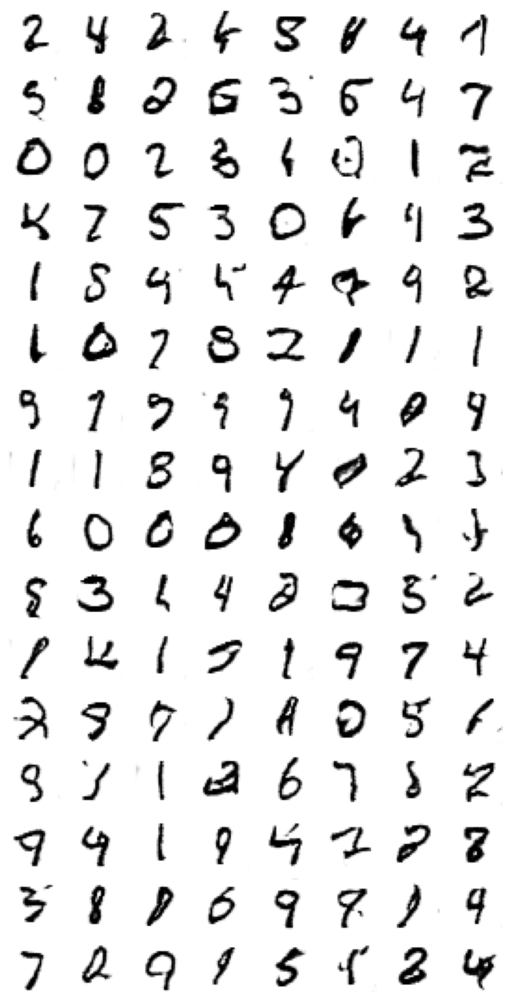

Epoch 40/50


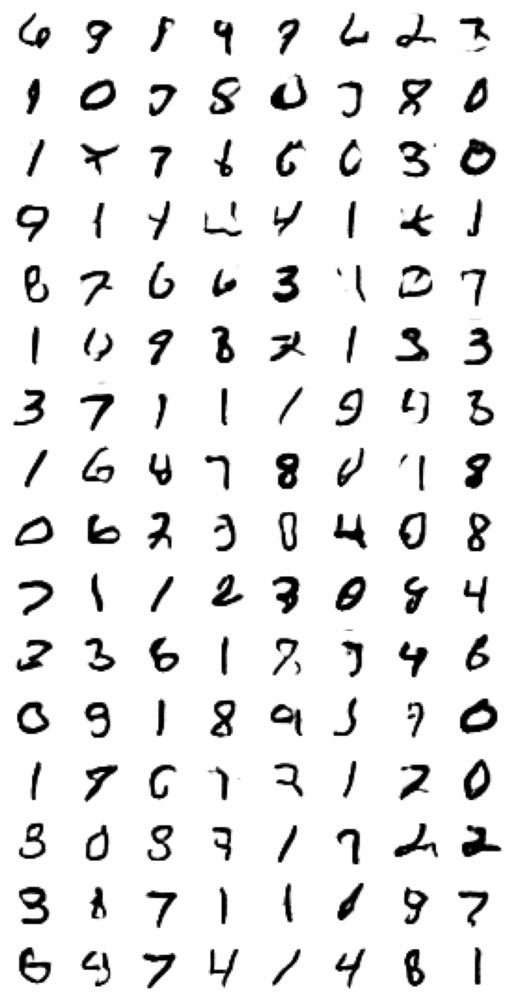

Epoch 41/50


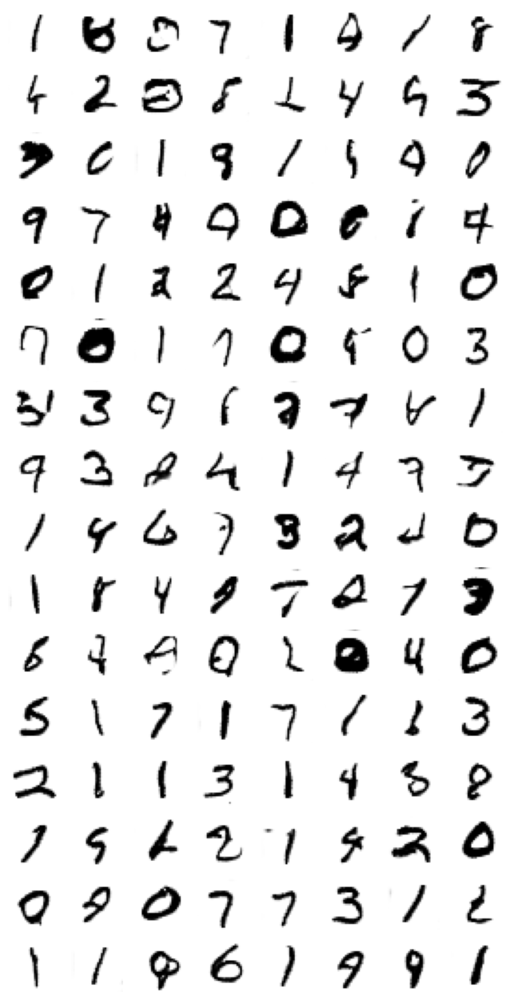

Epoch 42/50


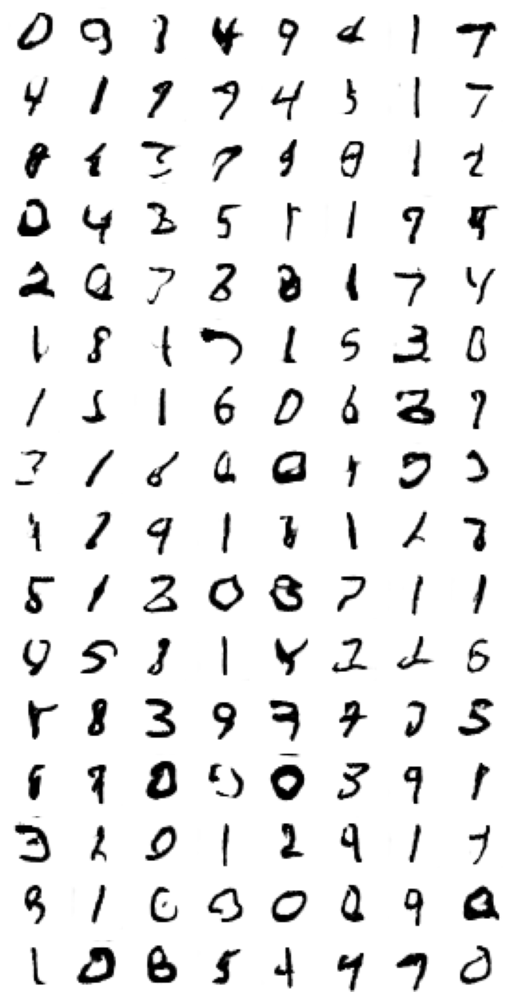

Epoch 43/50


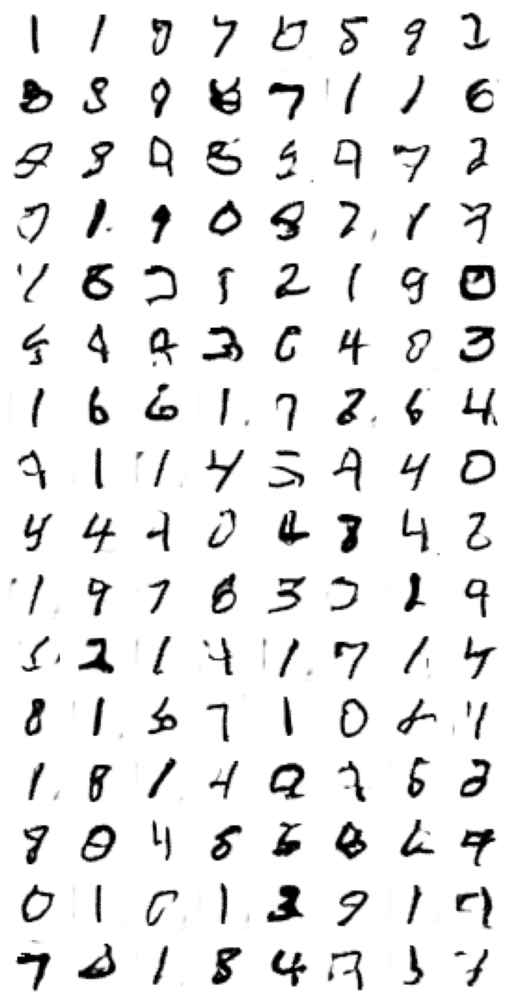

Epoch 44/50


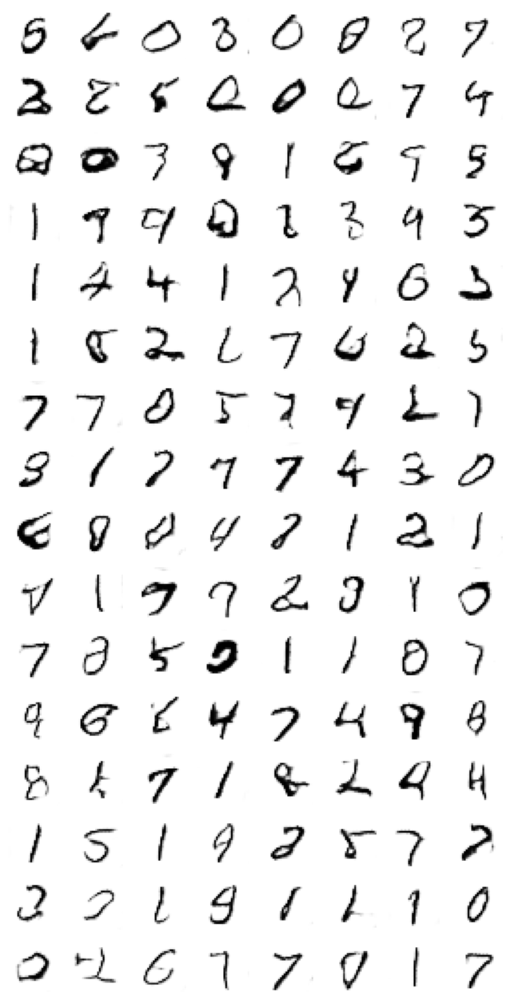

Epoch 45/50


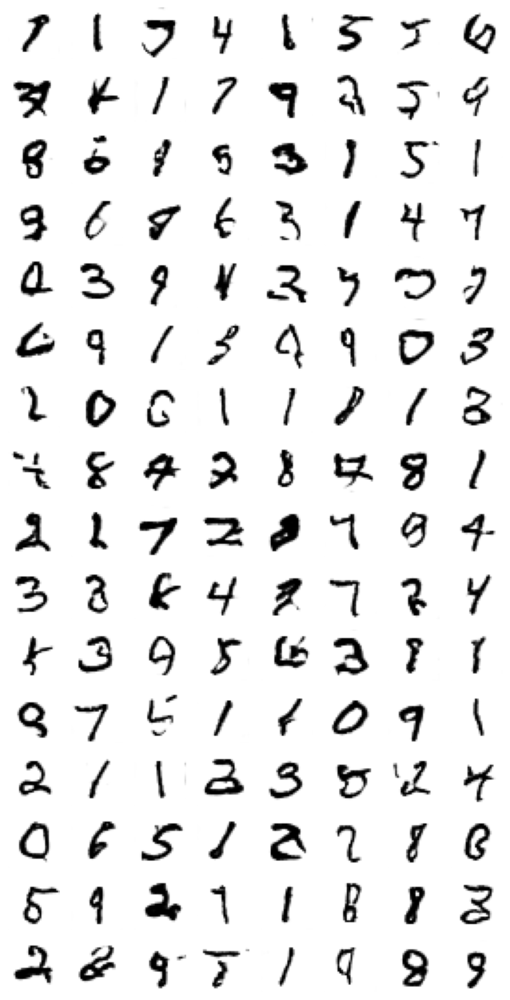

Epoch 46/50


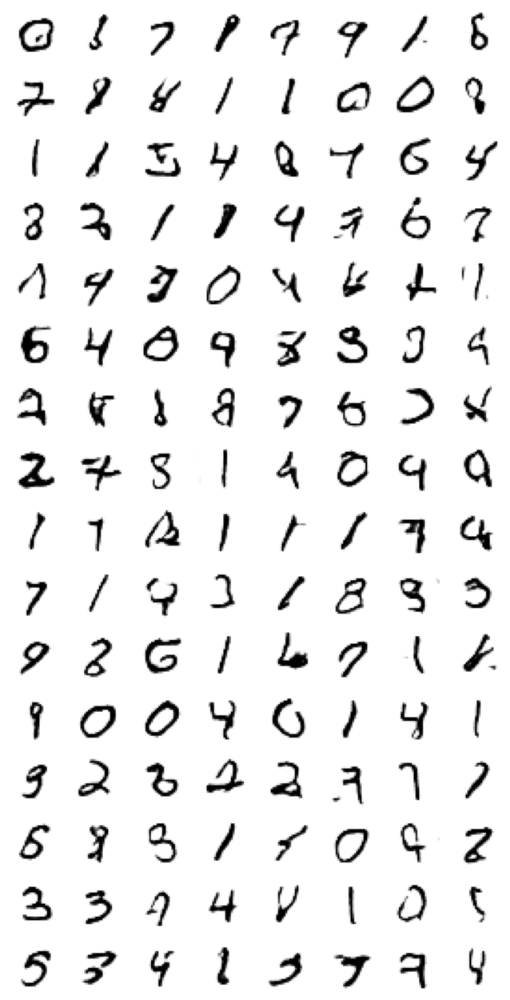

Epoch 47/50


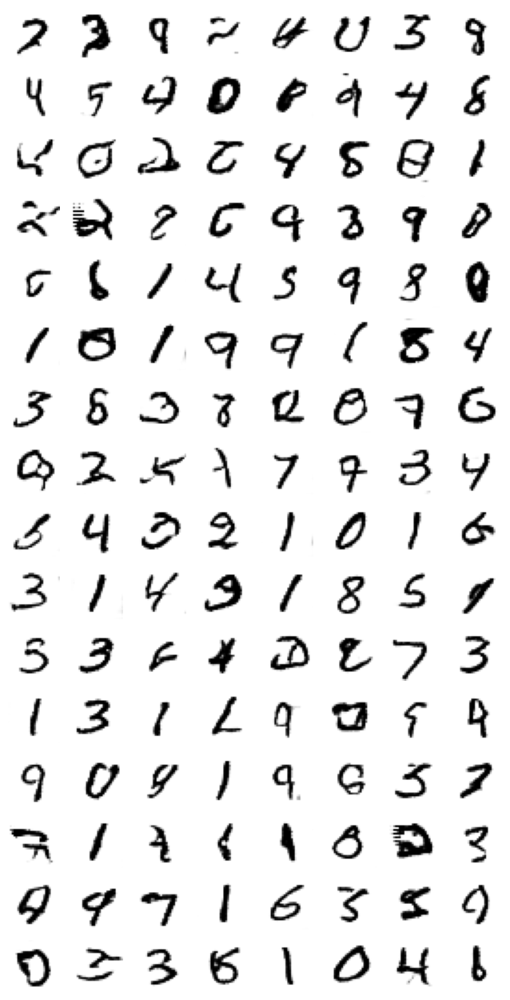

Epoch 48/50


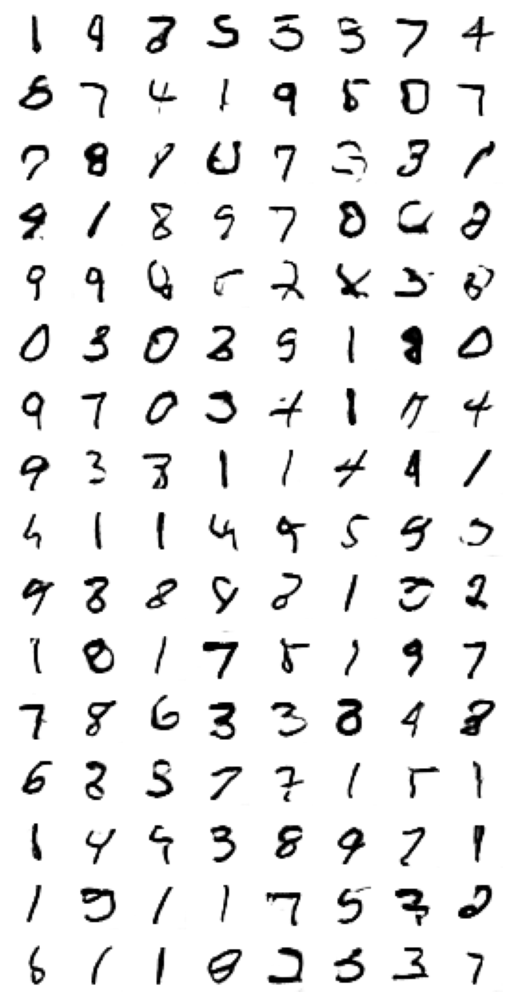

Epoch 49/50


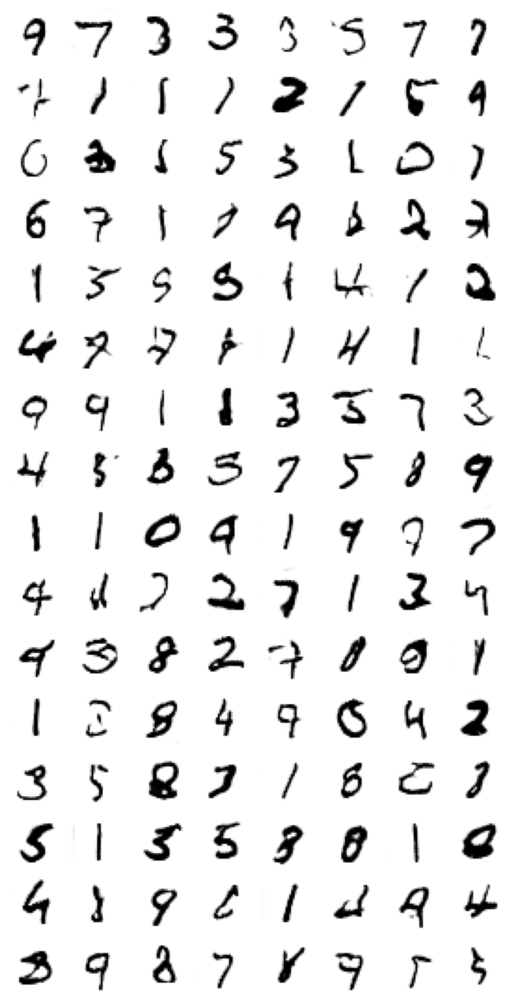

Epoch 50/50


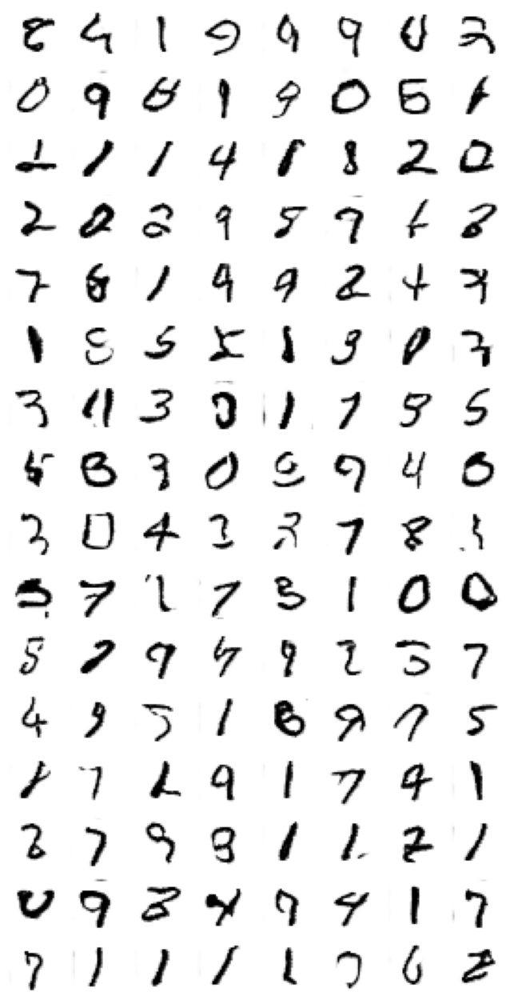

In [23]:
train_gan(GAN,dataset,100)

## Test

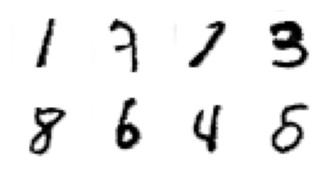

In [35]:
data_points = tf.random.normal(shape=[8,100])
gen_imgs = GAN.layers[0](data_points)
plot_img(gen_imgs,4)